In [1]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import numpy as np

In [2]:
df = pd.read_csv("D:\\clg\\internship\\t20batters.csv", encoding='latin1')
df

,Players,Span,Matches,Innings,Not outs,Runs,High Score,Average,Balls faced,Strike rate,100s,50s,0s,4s,6s
0,RG Sharma (IND),2007-2024,159,151,19,4231,121*,32.05,3003,140.89,5,32,12,383,205
1,V Kohli (IND),2010-2024,125,117,31,4188,122*,48.69,3056,137.04,1,38,7,369,124
2,Babar Azam (PAK),2016-2024,123,116,15,4145,122,41.03,3211,129.08,3,36,6,440,72
3,PR Stirling (IRE),2009-2024,145,144,11,3601,115*,27.07,2675,134.61,1,23,13,418,128
4,MJ Guptill (NZ),2009-2022,122,118,7,3531,105,31.81,2602,135.70,2,20,3,309,173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Junaid Siddique (BAN),2007-2012,7,7,0,159,71,22.71,108,147.22,0,1,1,16,7
996,RR Watson (SCOT),2007-2010,10,9,0,159,54,17.66,141,112.76,0,1,1,22,1
997,RGA Amah (CAM),2021-2023,17,16,0,158,20,9.87,219,72.14,0,0,1,13,1
998,PJ Cummins (AUS),2011-2024,57,27,12,158,28,10.53,133,118.79,0,0,4,11,7


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Players      1000 non-null   object 
 1   Span         1000 non-null   object 
 2   Matches      1000 non-null   int64  
 3   Innings      1000 non-null   int64  
 4   Not outs     1000 non-null   int64  
 5   Runs         1000 non-null   int64  
 6   High Score   1000 non-null   object 
 7   Average      1000 non-null   float64
 8   Balls faced  1000 non-null   int64  
 9   Strike rate  1000 non-null   float64
 10  100s         1000 non-null   int64  
 11  50s          1000 non-null   int64  
 12  0s           1000 non-null   int64  
 13  4s           1000 non-null   int64  
 14  6s           1000 non-null   int64  
dtypes: float64(2), int64(10), object(3)
memory usage: 117.3+ KB


In [4]:
df[["Start","End"]] = df["Span"].str.split("-",expand = True)
df["Start"] = df["Start"].astype(int)
df["End"] = df["End"].astype(int)
df

,Players,Span,Matches,Innings,Not outs,Runs,High Score,Average,Balls faced,Strike rate,100s,50s,0s,4s,6s,Start,End
0,RG Sharma (IND),2007-2024,159,151,19,4231,121*,32.05,3003,140.89,5,32,12,383,205,2007,2024
1,V Kohli (IND),2010-2024,125,117,31,4188,122*,48.69,3056,137.04,1,38,7,369,124,2010,2024
2,Babar Azam (PAK),2016-2024,123,116,15,4145,122,41.03,3211,129.08,3,36,6,440,72,2016,2024
3,PR Stirling (IRE),2009-2024,145,144,11,3601,115*,27.07,2675,134.61,1,23,13,418,128,2009,2024
4,MJ Guptill (NZ),2009-2022,122,118,7,3531,105,31.81,2602,135.70,2,20,3,309,173,2009,2022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Junaid Siddique (BAN),2007-2012,7,7,0,159,71,22.71,108,147.22,0,1,1,16,7,2007,2012
996,RR Watson (SCOT),2007-2010,10,9,0,159,54,17.66,141,112.76,0,1,1,22,1,2007,2010
997,RGA Amah (CAM),2021-2023,17,16,0,158,20,9.87,219,72.14,0,0,1,13,1,2021,2023
998,PJ Cummins (AUS),2011-2024,57,27,12,158,28,10.53,133,118.79,0,0,4,11,7,2011,2024


In [5]:
df['Players'].str.split('(', expand=True)

,0,1,2
0,RG Sharma,IND),None
1,V Kohli,IND),None
2,Babar Azam,PAK),None
3,PR Stirling,IRE),None
4,MJ Guptill,NZ),None
...,...,...,...
995,Junaid Siddique,BAN),None
996,RR Watson,SCOT),None
997,RGA Amah,CAM),None
998,PJ Cummins,AUS),None


In [6]:
df[["Player Names","Nation","none"]] = df['Players'].str.split('(', expand=True)
df["Nation"] = df["Nation"].str.replace(')','')
df.iloc[:,-2].unique()

array(['IND', 'PAK', 'IRE', 'NZ', 'AUS', 'ENG', 'SA', 'BAN', 'SA/World',
       'ICC/PAK', 'MAS', 'SCOT', 'AFG', 'UGA', 'WI', 'ZIM', 'UAE', 'SL',
       'NED', 'BAN/ICC/World', 'KENYA', 'HKG', 'NEP', 'PNG', 'HKG/NZ',
       'KUW', 'QAT', 'NAM', 'TAN', 'OMA', 'JER', 'RWN', 'MLT',
       'ICC/SL/World', 'ROM', 'CZK-R', 'AUS/SGP', 'JPN', 'MWI', 'GIBR',
       'BHR', 'KSA', 'BOT', 'Aut', 'SGP', 'CAN', 'VAN', 'LUX', 'Belg',
       'MOZ', 'BER', 'BUL', 'USA', 'SUI', 'Fran', 'DEN', 'SRB', 'GUE',
       'GHA', 'NZ/USA', 'NGA', 'ICC/IND', 'CAM', 'NAM/SA', 'GER',
       'CAN/USA', 'MDV', 'ESP', 'FIN', 'WI/World', 'ENG/World', 'INA',
       'NOR', 'HUN', 'NED/SA', 'IOM', 'ENG/ICC', '3\xa0', 'AUS/World',
       'PORT', 'ITA', 'AFG/ICC', 'THAI', 'Bhm', 'ENG/IRE', 'SLE', 'SWZ',
       'Arg', 'BHU', 'AUS/ICC/NZ', 'EST', 'PHI', 'CAY', 'LES', 'Fiji',
       'USA/WI', 'COK', 'SWE', 'Samoa', 'SEY', 'Mex', 'ISR', 'PAN',
       'NED/NZ', 'CYP', 'SWA/SWZ', 'Blz', 'NZ/World', 'SVN', 'TKY'],
      dtype=objec

In [7]:
df.replace(to_replace = 'ICC/PAK',value = 'PAK',inplace = True)
df.replace(to_replace = 'SA/World',value = 'SA',inplace = True)
df.replace(to_replace = 'BAN/ICC/World',value = 'BAN',inplace = True)
df.replace(to_replace = 'ICC/SL/World',value = 'SL',inplace = True)
df.replace(to_replace = 'ICC/IND',value = 'IND',inplace = True)
df.replace(to_replace = 'WI/World',value = 'WI',inplace = True)
df.replace(to_replace = 'AUS/World',value = 'AUS',inplace = True)
df.replace(to_replace = 'NZ/World',value = 'NZ',inplace = True)
df.replace(to_replace = 'AFG/ICC',value = 'AFG',inplace = True)
df.replace(to_replace = 'ENG/ICC',value = 'ENG',inplace = True)
df.replace(to_replace = 'ENG/World',value = 'ENG',inplace = True)
df.replace(to_replace = 'AUS/ICC/NZ',value = 'AUS/NZ',inplace = True)
df.iloc[:,-2].unique()

array(['IND', 'PAK', 'IRE', 'NZ', 'AUS', 'ENG', 'SA', 'BAN', 'MAS',
       'SCOT', 'AFG', 'UGA', 'WI', 'ZIM', 'UAE', 'SL', 'NED', 'KENYA',
       'HKG', 'NEP', 'PNG', 'HKG/NZ', 'KUW', 'QAT', 'NAM', 'TAN', 'OMA',
       'JER', 'RWN', 'MLT', 'ROM', 'CZK-R', 'AUS/SGP', 'JPN', 'MWI',
       'GIBR', 'BHR', 'KSA', 'BOT', 'Aut', 'SGP', 'CAN', 'VAN', 'LUX',
       'Belg', 'MOZ', 'BER', 'BUL', 'USA', 'SUI', 'Fran', 'DEN', 'SRB',
       'GUE', 'GHA', 'NZ/USA', 'NGA', 'CAM', 'NAM/SA', 'GER', 'CAN/USA',
       'MDV', 'ESP', 'FIN', 'INA', 'NOR', 'HUN', 'NED/SA', 'IOM', '3\xa0',
       'PORT', 'ITA', 'THAI', 'Bhm', 'ENG/IRE', 'SLE', 'SWZ', 'Arg',
       'BHU', 'AUS/NZ', 'EST', 'PHI', 'CAY', 'LES', 'Fiji', 'USA/WI',
       'COK', 'SWE', 'Samoa', 'SEY', 'Mex', 'ISR', 'PAN', 'NED/NZ', 'CYP',
       'SWA/SWZ', 'Blz', 'SVN', 'TKY'], dtype=object)

In [8]:
df["High Score"] = df["High Score"].str.replace("*","")
df["High Score"] = df["High Score"].astype(int)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Players       1000 non-null   object 
 1   Span          1000 non-null   object 
 2   Matches       1000 non-null   int64  
 3   Innings       1000 non-null   int64  
 4   Not outs      1000 non-null   int64  
 5   Runs          1000 non-null   int64  
 6   High Score    1000 non-null   int32  
 7   Average       1000 non-null   float64
 8   Balls faced   1000 non-null   int64  
 9   Strike rate   1000 non-null   float64
 10  100s          1000 non-null   int64  
 11  50s           1000 non-null   int64  
 12  0s            1000 non-null   int64  
 13  4s            1000 non-null   int64  
 14  6s            1000 non-null   int64  
 15  Start         1000 non-null   int32  
 16  End           1000 non-null   int32  
 17  Player Names  1000 non-null   object 
 18  Nation        1000 non-null  

In [10]:
df.style

,Players,Span,Matches,Innings,Not outs,Runs,High Score,Average,Balls faced,Strike rate,100s,50s,0s,4s,6s,Start,End,Player Names,Nation,none
0,RG Sharma (IND),2007-2024,159,151,19,4231,121,32.050000,3003,140.890000,5,32,12,383,205,2007,2024,RG Sharma,IND,None
1,V Kohli (IND),2010-2024,125,117,31,4188,122,48.690000,3056,137.040000,1,38,7,369,124,2010,2024,V Kohli,IND,None
2,Babar Azam (PAK),2016-2024,123,116,15,4145,122,41.030000,3211,129.080000,3,36,6,440,72,2016,2024,Babar Azam,PAK,None
3,PR Stirling (IRE),2009-2024,145,144,11,3601,115,27.070000,2675,134.610000,1,23,13,418,128,2009,2024,PR Stirling,IRE,None
4,MJ Guptill (NZ),2009-2022,122,118,7,3531,105,31.810000,2602,135.700000,2,20,3,309,173,2009,2022,MJ Guptill,NZ,None
5,Mohammad Rizwan (PAK),2015-2024,102,89,21,3313,104,48.720000,2620,126.450000,1,29,4,278,92,2015,2024,Mohammad Rizwan,PAK,None
6,DA Warner (AUS),2009-2024,110,110,12,3277,100,33.430000,2300,142.470000,1,28,6,337,122,2009,2024,DA Warner,AUS,None
7,JC Buttler (ENG),2011-2024,124,114,23,3264,101,35.860000,2231,146.300000,1,24,7,300,137,2011,2024,JC Buttler,ENG,None
8,AJ Finch (AUS),2011-2022,103,103,12,3120,172,34.280000,2189,142.530000,2,19,8,309,125,2011,2022,AJ Finch,AUS,None
9,GJ Maxwell (AUS),2012-2024,113,104,17,2600,145,29.880000,1680,154.760000,5,11,4,217,134,2012,2024,GJ Maxwell,AUS,None


In [11]:
numerical_data = df[["Start","End","Matches","Innings","Not outs","Runs","High Score","Average","Balls faced","Strike rate","100s","50s","0s","4s","6s"]]
numerical_data

,Start,End,Matches,Innings,Not outs,Runs,High Score,Average,Balls faced,Strike rate,100s,50s,0s,4s,6s
0,2007,2024,159,151,19,4231,121,32.05,3003,140.89,5,32,12,383,205
1,2010,2024,125,117,31,4188,122,48.69,3056,137.04,1,38,7,369,124
2,2016,2024,123,116,15,4145,122,41.03,3211,129.08,3,36,6,440,72
3,2009,2024,145,144,11,3601,115,27.07,2675,134.61,1,23,13,418,128
4,2009,2022,122,118,7,3531,105,31.81,2602,135.70,2,20,3,309,173
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2007,2012,7,7,0,159,71,22.71,108,147.22,0,1,1,16,7
996,2007,2010,10,9,0,159,54,17.66,141,112.76,0,1,1,22,1
997,2021,2023,17,16,0,158,20,9.87,219,72.14,0,0,1,13,1
998,2011,2024,57,27,12,158,28,10.53,133,118.79,0,0,4,11,7


<Axes: >

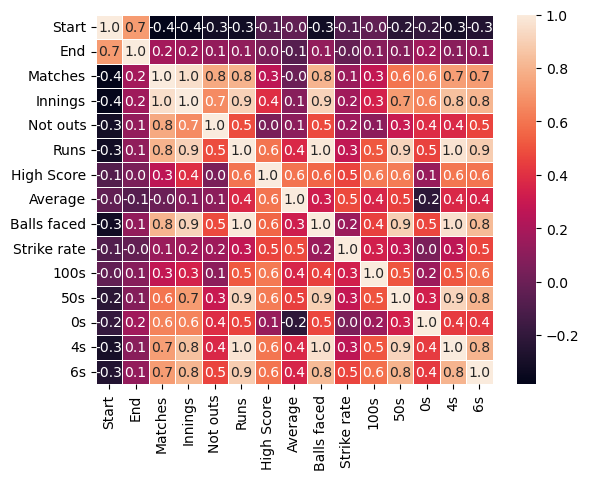

In [12]:
import seaborn as sns
sns.heatmap(numerical_data.corr(),annot=True,fmt = ".1f",linewidth = 0.5)

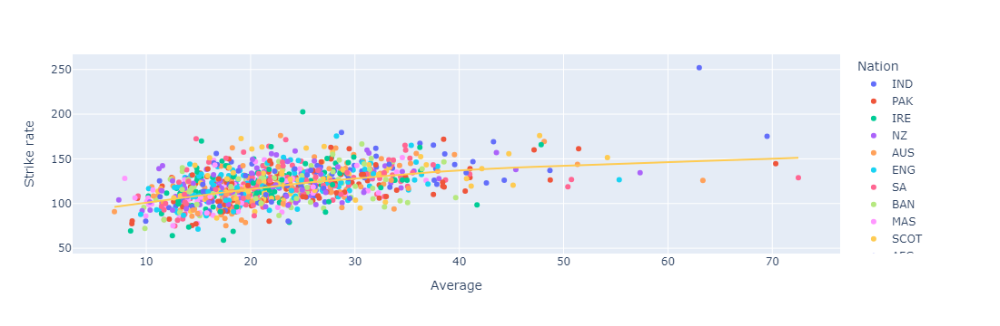

In [13]:
import plotly.express as px
px.scatter(df,x = "Average", y = "Strike rate",trendline = 'lowess',color = "Nation",trendline_scope = "overall")

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid 

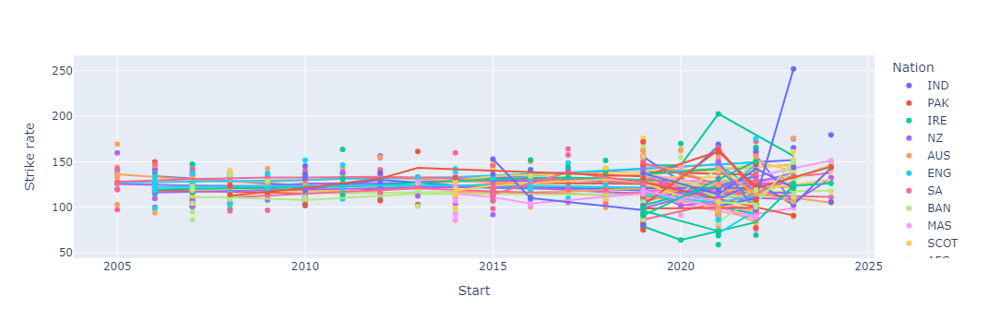

In [14]:
px.scatter(df,x = "Start",y = "Strike rate",color = "Nation",trendline = "lowess")

In [15]:
top_df = df[df["Nation"].isin(["IND","PAK","SL","AUS","NZ","SA","WI","ENG"])]
top_df

,Players,Span,Matches,Innings,Not outs,Runs,High Score,Average,Balls faced,Strike rate,100s,50s,0s,4s,6s,Start,End,Player Names,Nation,none
0,RG Sharma (IND),2007-2024,159,151,19,4231,121,32.05,3003,140.89,5,32,12,383,205,2007,2024,RG Sharma,IND,None
1,V Kohli (IND),2010-2024,125,117,31,4188,122,48.69,3056,137.04,1,38,7,369,124,2010,2024,V Kohli,IND,None
2,Babar Azam (PAK),2016-2024,123,116,15,4145,122,41.03,3211,129.08,3,36,6,440,72,2016,2024,Babar Azam,PAK,None
4,MJ Guptill (NZ),2009-2022,122,118,7,3531,105,31.81,2602,135.70,2,20,3,309,173,2009,2022,MJ Guptill,NZ,None
5,Mohammad Rizwan (PAK),2015-2024,102,89,21,3313,104,48.72,2620,126.45,1,29,4,278,92,2015,2024,Mohammad Rizwan,PAK,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
976,ME Trescothick (ENG),2005-2006,3,3,0,166,72,55.33,131,126.71,0,2,0,23,1,2005,2006,ME Trescothick,ENG,None
978,Umar Gul (PAK),2007-2016,60,27,9,165,32,9.16,156,105.76,0,0,6,11,10,2007,2016,Umar Gul,PAK,None
989,H Davids (SA),2012-2013,9,9,0,161,68,17.88,134,120.14,0,2,2,18,4,2012,2013,H Davids,SA,None
994,JP Faulkner (AUS),2012-2017,24,18,7,159,41,14.45,138,115.21,0,0,0,7,5,2012,2017,JP Faulkner,AUS,None


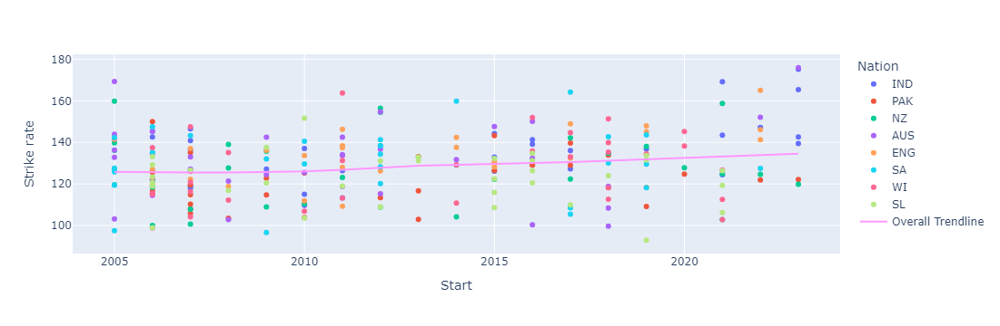

In [16]:
px.scatter(top_df,x = "Start", y = "Strike rate", color = "Nation", trendline = "lowess",trendline_scope="overall")

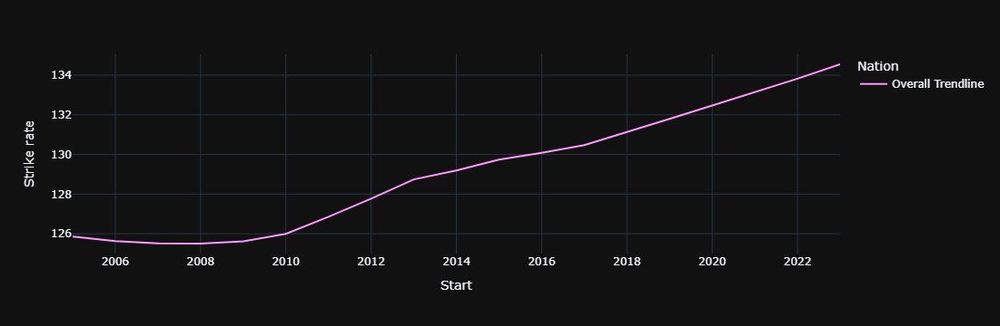

In [17]:
fig2 = px.scatter(top_df,x = "Start", y = "Strike rate", color = "Nation", trendline = "lowess",trendline_scope="overall",template="plotly_dark")
fig2.data = [t for t in fig2.data if t.mode == "lines"]
fig2.update_traces(showlegend=True)

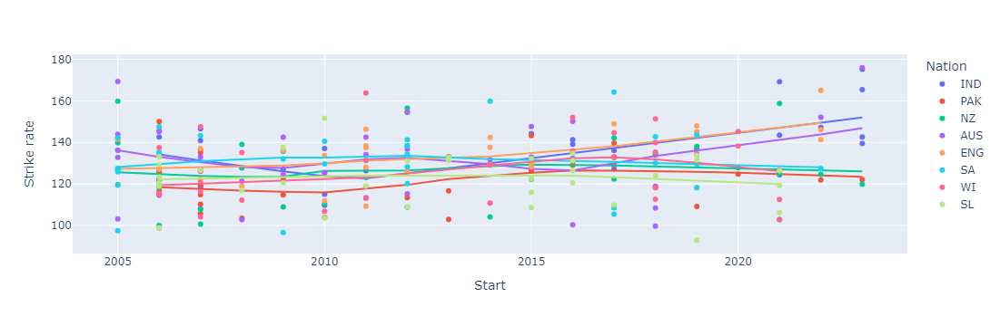

In [18]:
px.scatter(top_df,x = "Start", y = "Strike rate", color = "Nation", trendline = "lowess")

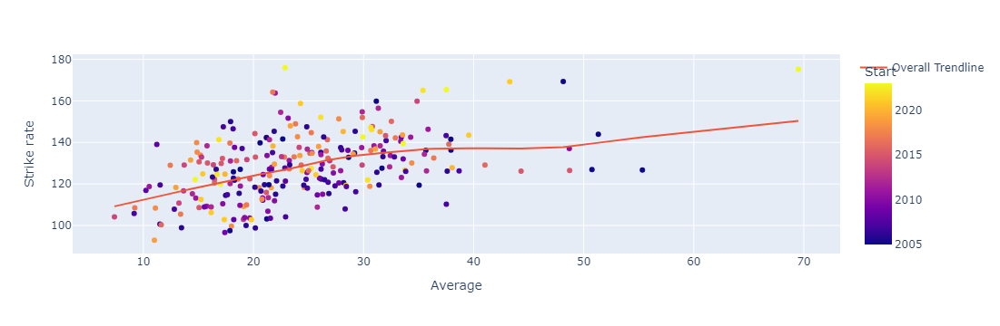

In [19]:
px.scatter(top_df,x = "Average", y = "Strike rate", color = "Start", trendline = "lowess",trendline_scope="overall")

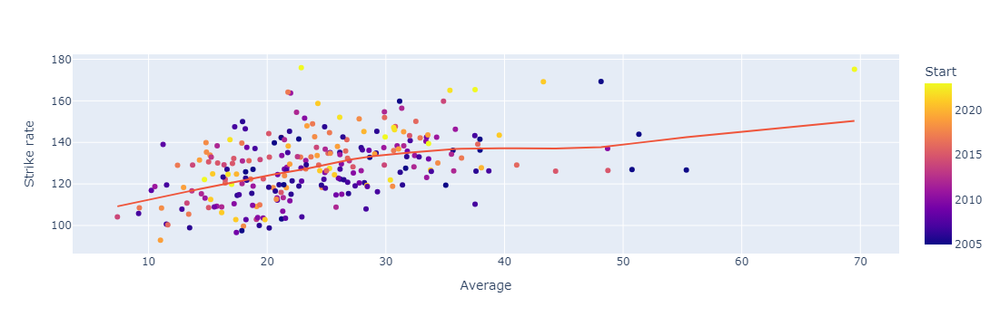

In [20]:
px.scatter(top_df,x = "Average", y = "Strike rate", color = "Start", trendline = "lowess")

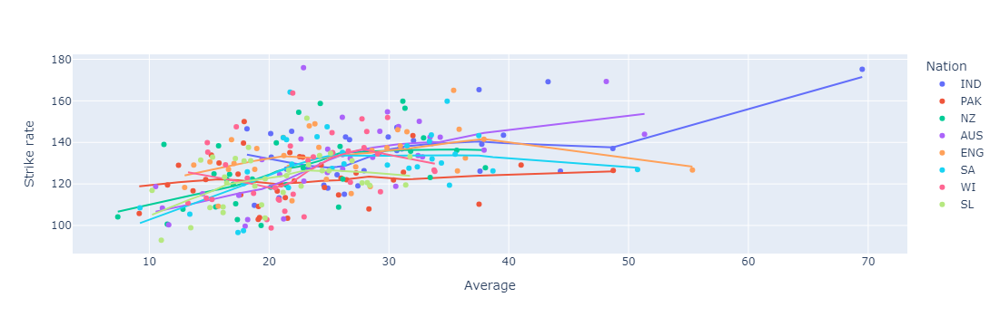

In [21]:
px.scatter(top_df,x = "Average", y = "Strike rate", color = "Nation", trendline = "lowess")

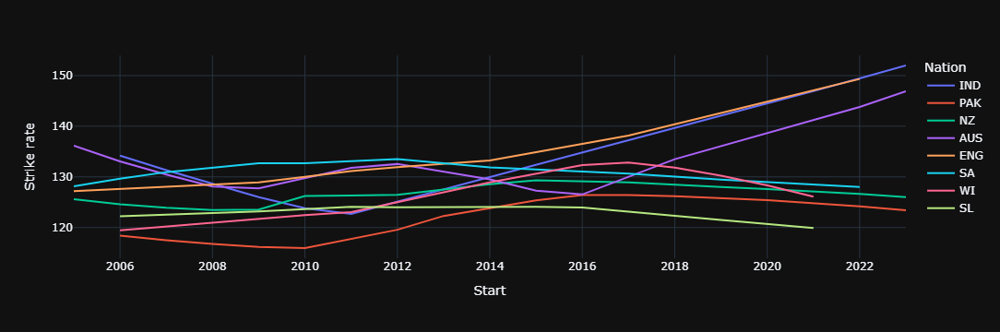

In [22]:
fig = px.scatter(top_df,x = "Start", y = "Strike rate", color = "Nation", trendline = "lowess",template = "plotly_dark")
fig.data = [t for t in fig.data if t.mode == "lines"]
fig.update_traces(showlegend=True)

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid 

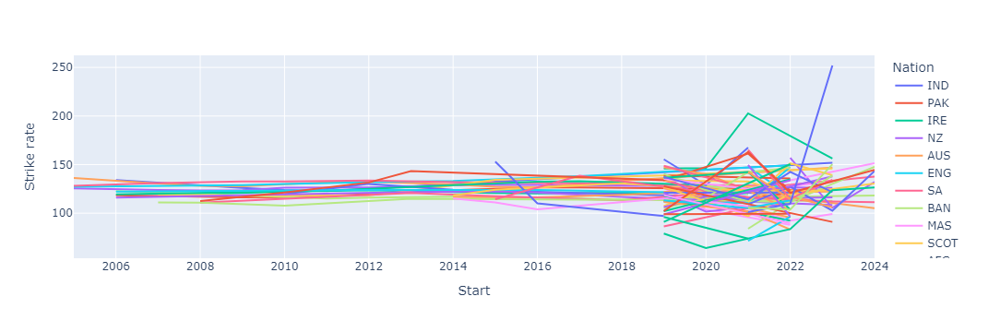

In [23]:
fig = px.scatter(df,x = "Start", y = "Strike rate", color = "Nation", trendline = "lowess")
fig.data = [t for t in fig.data if t.mode == "lines"]
fig.update_traces(showlegend=True)

In [24]:
fig.data

(Scatter({
     'hovertemplate': ('<b>LOWESS trendline</b><br><br' ... ' <b>(trend)</b><extra></extra>'),
     'legendgroup': 'IND',
     'marker': {'color': '#636efa', 'symbol': 'circle'},
     'mode': 'lines',
     'name': 'IND',
     'showlegend': True,
     'x': array([2006, 2006, 2006, 2006, 2006, 2007, 2007, 2007, 2007, 2007, 2009, 2010,
                 2010, 2010, 2011, 2011, 2015, 2015, 2015, 2016, 2016, 2017, 2017, 2019,
                 2021, 2021, 2021, 2022, 2023, 2023, 2023, 2023]),
     'xaxis': 'x',
     'y': array([134.18300442, 134.18300442, 134.18300442, 134.18300442, 134.18300442,
                 131.32067423, 131.32067423, 131.32067423, 131.32067423, 131.32067423,
                 126.0123973 , 123.80539391, 123.80539391, 123.80539391, 122.68237364,
                 122.68237364, 132.37725367, 132.37725367, 132.37725367, 134.7952444 ,
                 134.7952444 , 137.10738315, 137.10738315, 142.02287668, 146.94377744,
                 146.94377744, 146.94377744,

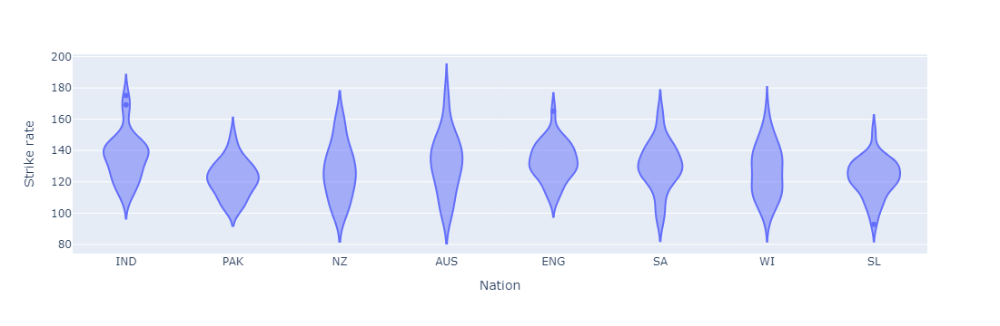

In [25]:
px.violin(top_df,x = "Nation",y = "Strike rate")

In [26]:
import bokeh

In [38]:
s = requests.get("https://en.wikipedia.org/wiki/ICC_Men%27s_T20_World_Cup")
s

<Response [200]>

In [39]:
s.text

'<!DOCTYPE html>\n<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-enabled vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-toc-available" lang="en" dir="ltr">\n<head>\n<meta charset="UTF-8">\n<title>ICC Men\'s T20 World Cup - Wikipedia</title>\n<script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled v

In [40]:
soup = BeautifulSoup(s.text,"html.parser")
soup

<!DOCTYPE html>

<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-enabled vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-toc-available" dir="ltr" lang="en">
<head>
<meta charset="utf-8"/>
<title>ICC Men's T20 World Cup - Wikipedia</title>
<script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector

In [41]:
soup.prettify()

'<!DOCTYPE html>\n<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-enabled vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-toc-available" dir="ltr" lang="en">\n <head>\n  <meta charset="utf-8"/>\n  <title>\n   ICC Men\'s T20 World Cup - Wikipedia\n  </title>\n  <script>\n   (function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-

In [42]:
t = soup.find_all("table",{"class":"wikitable"})
t

[<table class="wikitable floatright" style="background:#F5FAFF; text-align:center; font-size:85%">
 <caption>Winners<br/> T20 World Cups
 </caption>
 <tbody><tr>
 <th>Year</th>
 <th style="width:150px">Champions
 </th></tr>
 <tr>
 <td><a href="/wiki/2007_ICC_World_Twenty20" title="2007 ICC World Twenty20">2007</a>
 </td>
 <td style="text-align:left"><span class="flagicon"><span class="mw-image-border" typeof="mw:File"><span><img alt="" class="mw-file-element" data-file-height="600" data-file-width="900" decoding="async" height="15" src="//upload.wikimedia.org/wikipedia/en/thumb/4/41/Flag_of_India.svg/23px-Flag_of_India.svg.png" srcset="//upload.wikimedia.org/wikipedia/en/thumb/4/41/Flag_of_India.svg/35px-Flag_of_India.svg.png 1.5x, //upload.wikimedia.org/wikipedia/en/thumb/4/41/Flag_of_India.svg/45px-Flag_of_India.svg.png 2x" width="23"/></span></span> </span><a href="/wiki/India_national_cricket_team" title="India national cricket team">India</a>
 </td></tr>
 <tr>
 <td><a href="/wiki/

In [43]:
#players = []
for i in t:
    print(i.find("tbody").text)
 #   players.append(i.find("span").text)
#players.remove("Player")
#players


Year
Champions


2007

 India


2009

 Pakistan


2010

 England


2012

 West Indies


2014

 Sri Lanka


2016

 West Indies (2)


2021

 Australia


2022

 England (2)


2024

 India (2)



Ed.

Year

Host(s)

Final venue

Final

Teams


Winner

Result

Runner-up


1

2007

 South Africa

Wanderers Stadium, Johannesburg

India157/5 (20 overs)

India won by 5 runs(scorecard)

Pakistan152 all out (19.4 overs)

12


2

2009

 England

Lord's, London

Pakistan139/2 (18.4 overs)

Pakistan won by 8 wickets(scorecard)

Sri Lanka138/6 (20 overs)

12


3

2010

 West Indies

Kensington Oval, Bridgetown

England148/3 (17 overs)

England won by 7 wickets(scorecard)

Australia147/6 (20 overs)

12


4

2012

 Sri Lanka

R Premadasa Stadium, Colombo

West Indies137/6 (20 overs)

West Indies won by 36 runs(scorecard)

Sri Lanka101 all out (18.4 overs)

12


5

2014

 Bangladesh

Sher-e-Bangla Stadium,Dhaka

Sri Lanka134/4 (17.5 overs)

Sri Lanka won by 6 wickets(scorecard)

India130/4 (20 overs)



In [44]:
Aus = {"world cup":[3,11,2,3,8,6,1,5],"strike rate":[3,3,3,2,4,6,3,3],"year":[2007,2009,2010,2012,2014,2016,2021,2022]}
Eng = {"world cup":[7,6,1,6,7,2,4,1],"strike rate":[4,2,2,3,1,1,1,2],"year":[2007,2009,2010,2012,2014,2016,2021,2022]}
Ind = {"world cup":[1,7,8,5,2,4,6,3],"strike rate":[1,4,5,5,3,2,2,1],"year":[2007,2009,2010,2012,2014,2016,2021,2022]}
NZ  = {"world cup":[4,5,5,7,6,3,2,4],"strike rate":[5,5,4,4,6,5,5,5],"year":[2007,2009,2010,2012,2014,2016,2021,2022]}
Pak = {"world cup":[2,1,4,4,5,7,3,2],"strike rate":[8,8,8,8,8,7,7,6],"year":[2007,2009,2010,2012,2014,2016,2021,2022]}
SA  = {"world cup":[5,3,6,8,4,5,5,6],"strike rate":[2,1,1,1,2,4,4,4],"year":[2007,2009,2010,2012,2014,2016,2021,2022]}
SL  = {"world cup":[6,2,3,2,1,8,8,8],"strike rate":[6,6,6,7,7,8,8,8],"year":[2007,2009,2010,2012,2014,2016,2021,2022]}
WI  = {"world cup":[11,4,6,1,3,1,9,15],"strike rate":[7,7,7,6,5,3,6,7],"year":[2007,2009,2010,2012,2014,2016,2021,2022]}
Aus = pd.DataFrame(Aus)
Eng = pd.DataFrame(Eng)
Ind = pd.DataFrame(Ind)
NZ = pd.DataFrame(NZ)
Pak = pd.DataFrame(Pak)
SA = pd.DataFrame(SA)
SL = pd.DataFrame(SL)
WI = pd.DataFrame(WI)

In [45]:
print("Aus:\n",Aus.corr(),"\n")
print("Eng:\n",Eng.corr(),"\n")
print("Ind:\n",Ind.corr(),"\n")
print("NZ:\n",NZ.corr(),"\n")
print("Pak:\n",Pak.corr(),"\n")
print("SA:\n",SA.corr(),"\n")
print("SL:\n",SL.corr(),"\n")
print("WI:\n",WI.corr(),"\n")

Aus:
              world cup  strike rate      year
world cup     1.000000     0.300087 -0.202570
strike rate   0.300087     1.000000  0.183529
year         -0.202570     0.183529  1.000000 

Eng:
              world cup  strike rate      year
world cup     1.000000     0.359092 -0.507080
strike rate   0.359092     1.000000 -0.608671
year         -0.507080    -0.608671  1.000000 

Ind:
              world cup  strike rate      year
world cup     1.000000     0.692574 -0.058442
strike rate   0.692574     1.000000 -0.445796
year         -0.058442    -0.445796  1.000000 

NZ:
              world cup  strike rate      year
world cup     1.000000    -0.208514 -0.495052
strike rate  -0.208514     1.000000  0.238603
year         -0.495052     0.238603  1.000000 

Pak:
                 world cup   strike rate      year
world cup    1.000000e+00  1.741861e-16  0.155310
strike rate  1.741861e-16  1.000000e+00 -0.878006
year         1.553097e-01 -8.780063e-01  1.000000 

SA:
              world c

In [46]:
pos = {"Nation":["Aus","Aus","Aus","Aus","Aus","Aus","Aus","Aus","Aus",
                 "Eng","Eng","Eng","Eng","Eng","Eng","Eng","Eng","Eng",
                 "Ind","Ind","Ind","Ind","Ind","Ind","Ind","Ind","Ind",
                 "NZ","NZ","NZ","NZ","NZ","NZ","NZ","NZ","NZ",
                 "Pak","Pak","Pak","Pak","Pak","Pak","Pak","Pak","Pak",
                 "SA","SA","SA","SA","SA","SA","SA","SA","SA",
                 "SL","SL","SL","SL","SL","SL","SL","SL","SL",
                 "WI","WI","WI","WI","WI","WI","WI","WI","WI"],
       "World cup":[3,11,2,3,8,6,1,5,6,7,6,1,6,7,2,4,1,4,
                    1,7,8,5,2,4,6,3,1,4,5,5,7,6,3,2,4,10,
                    2,1,4,4,5,7,3,2,11,5,3,6,8,4,5,5,6,2,
                    6,2,3,2,1,8,8,8,12,11,4,6,1,3,1,9,15,5],
       "Strike rate":[2,4,3,2,3,6,3,3,3,4,2,2,3,1,1,1,1,2,
                      1,3,4,7,4,2,2,2,1,5,5,5,4,5,5,6,5,5,
                      8,8,8,8,8,7,7,7,7,3,1,1,1,2,3,4,4,4,
                      6,6,6,5,7,8,8,8,8,7,7,7,6,6,4,5,6,6],
       "Year":[2007,2009,2010,2012,2014,2016,2021,2022,2024,
               2007,2009,2010,2012,2014,2016,2021,2022,2024,
               2007,2009,2010,2012,2014,2016,2021,2022,2024,
               2007,2009,2010,2012,2014,2016,2021,2022,2024,
               2007,2009,2010,2012,2014,2016,2021,2022,2024,
               2007,2009,2010,2012,2014,2016,2021,2022,2024,
               2007,2009,2010,2012,2014,2016,2021,2022,2024,
               2007,2009,2010,2012,2014,2016,2021,2022,2024]}
position = pd.DataFrame(pos)
position

,Nation,World cup,Strike rate,Year
0,Aus,3,2,2007
1,Aus,11,4,2009
2,Aus,2,3,2010
3,Aus,3,2,2012
4,Aus,8,3,2014
...,...,...,...,...
67,WI,3,6,2014
68,WI,1,4,2016
69,WI,9,5,2021
70,WI,15,6,2022


In [57]:
import numpy as np
from scipy.stats import gaussian_kde

from bokeh.palettes import Blues9
from bokeh.plotting import figure, show
from bokeh.sampledata.autompg import autompg as df


def kde(x, y, N):
    xmin, xmax = x.min(), x.max()
    ymin, ymax = y.min(), y.max()

    X, Y = np.mgrid[xmin:xmax:N*1j, ymin:ymax:N*1j]
    positions = np.vstack([X.ravel(), Y.ravel()])
    values = np.vstack([x, y])
    kernel = gaussian_kde(values)
    Z = np.reshape(kernel(positions).T, X.shape)

    return X, Y, Z

x, y, z = kde(position["World cup"], position["Strike rate"], 300)

p = figure(height=400, x_axis_label="World cup ranking", y_axis_label="Strike rate ranking",
           background_fill_color="#fafafa", tools="", toolbar_location=None,
           title="Kernel density estimation plot of World cup ranking vs Strike rate ranking")
p.grid.level = "overlay"
p.grid.grid_line_color = "black"
p.grid.grid_line_alpha = 0.05

palette = Blues9[::-1]
levels = np.linspace(np.min(z), np.max(z), 10)
p.contour(x, y, z, levels[1:], fill_color=palette, line_color=palette)

show(p)

In [47]:
position[["World cup","Strike rate"]].corr(method = 'spearman')

,World cup,Strike rate
World cup,1.000000,0.168194
Strike rate,0.168194,1.000000


In [48]:
def cor(c):
    return position[["World cup","Strike rate"]].where(position["Nation"] == c).corr(method = 'spearman')

In [49]:
for i in ["Aus","Eng","SA","Ind","NZ","Pak","SL","WI"]:
    print(i,'\n',cor(i),'\n')

Aus 
              World cup  Strike rate
World cup     1.000000     0.527371
Strike rate   0.527371     1.000000 

Eng 
              World cup  Strike rate
World cup     1.000000     0.401308
Strike rate   0.401308     1.000000 

SA 
              World cup  Strike rate
World cup     1.000000    -0.230125
Strike rate  -0.230125     1.000000 

Ind 
              World cup  Strike rate
World cup     1.000000     0.609582
Strike rate   0.609582     1.000000 

NZ 
              World cup  Strike rate
World cup     1.000000    -0.644402
Strike rate  -0.644402     1.000000 

Pak 
              World cup  Strike rate
World cup     1.000000    -0.305667
Strike rate  -0.305667     1.000000 

SL 
              World cup  Strike rate
World cup     1.000000     0.760812
Strike rate   0.760812     1.000000 

WI 
              World cup  Strike rate
World cup     1.000000     0.316084
Strike rate   0.316084     1.000000 



C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide

C:\Users\USER\anaconda3\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning:

invalid value encountered in divide



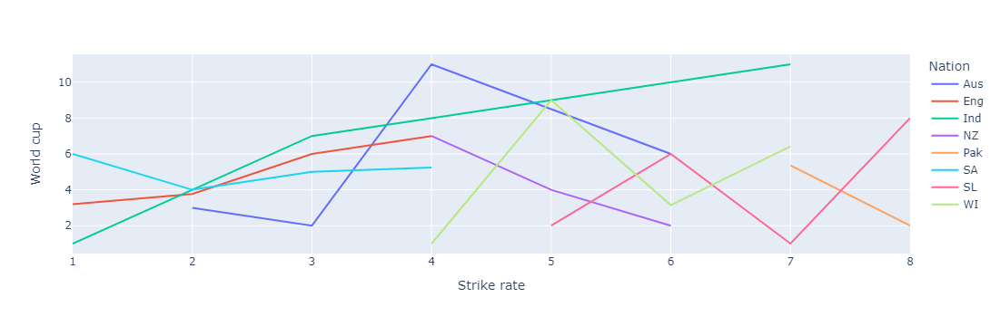

In [50]:
fig1 = px.scatter(position,x = "Strike rate", y = "World cup", color = "Nation",trendline = "lowess")
fig1.data = [t for t in fig1.data if t.mode == "lines"]
fig1.update_traces(showlegend=True)

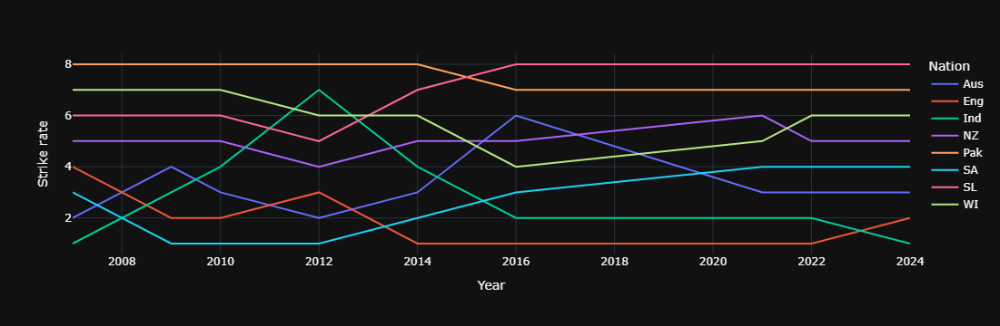

In [51]:
px.scatter(position,x = "Year", y = "Strike rate" , color = "Nation",template = "plotly_dark")
px.line(position,x = "Year", y = "Strike rate" , color = "Nation",template = "plotly_dark")

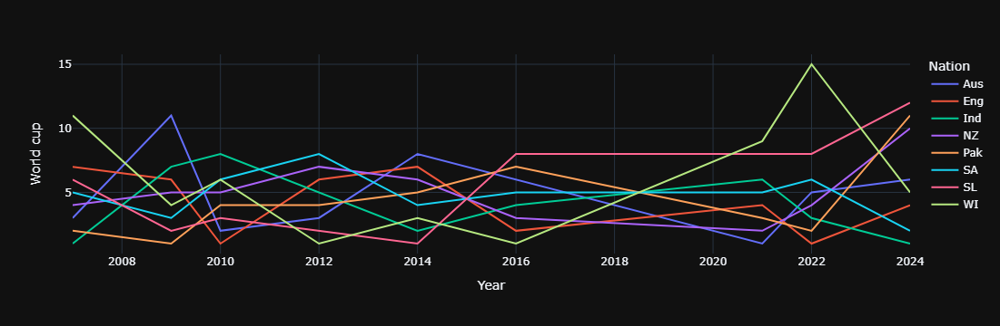

In [52]:
px.line(position,x = "Year", y = "World cup" , color = "Nation",template = "plotly_dark")

In [53]:
import plotly.graph_objects as go
go.Contour(pos,x =pos["World cup"],y = pos["Strike rate"])

ValueError: Invalid property specified for object of type plotly.graph_objs.Contour: 'Nation'

Did you mean "xaxis"?

    Valid properties:
        autocolorscale
            Determines whether the colorscale is a default palette
            (`autocolorscale: true`) or the palette determined by
            `colorscale`. In case `colorscale` is unspecified or
            `autocolorscale` is true, the default palette will be
            chosen according to whether numbers in the `color`
            array are all positive, all negative or mixed.
        autocontour
            Determines whether or not the contour level attributes
            are picked by an algorithm. If True, the number of
            contour levels can be set in `ncontours`. If False, set
            the contour level attributes in `contours`.
        coloraxis
            Sets a reference to a shared color axis. References to
            these shared color axes are "coloraxis", "coloraxis2",
            "coloraxis3", etc. Settings for these shared color axes
            are set in the layout, under `layout.coloraxis`,
            `layout.coloraxis2`, etc. Note that multiple color
            scales can be linked to the same color axis.
        colorbar
            :class:`plotly.graph_objects.contour.ColorBar` instance
            or dict with compatible properties
        colorscale
            Sets the colorscale. The colorscale must be an array
            containing arrays mapping a normalized value to an rgb,
            rgba, hex, hsl, hsv, or named color string. At minimum,
            a mapping for the lowest (0) and highest (1) values are
            required. For example, `[[0, 'rgb(0,0,255)'], [1,
            'rgb(255,0,0)']]`. To control the bounds of the
            colorscale in color space, use `zmin` and `zmax`.
            Alternatively, `colorscale` may be a palette name
            string of the following list: Blackbody,Bluered,Blues,C
            ividis,Earth,Electric,Greens,Greys,Hot,Jet,Picnic,Portl
            and,Rainbow,RdBu,Reds,Viridis,YlGnBu,YlOrRd.
        connectgaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the `z` data are filled in. It is defaulted
            to true if `z` is a one dimensional array otherwise it
            is defaulted to false.
        contours
            :class:`plotly.graph_objects.contour.Contours` instance
            or dict with compatible properties
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        dx
            Sets the x coordinate step. See `x0` for more info.
        dy
            Sets the y coordinate step. See `y0` for more info.
        fillcolor
            Sets the fill color if `contours.type` is "constraint".
            Defaults to a half-transparent variant of the line
            color, marker color, or marker line color, whichever is
            available.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.contour.Hoverlabel`
            instance or dict with compatible properties
        hoverongaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the `z` data have hover labels associated
            with them.
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            "<extra>{fullData.name}</extra>". To hide the secondary
            box completely, use an empty tag `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Same as `text`.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        legend
            Sets the reference to a legend to show this trace in.
            References to these legends are "legend", "legend2",
            "legend3", etc. Settings for these legends are set in
            the layout, under `layout.legend`, `layout.legend2`,
            etc.
        legendgroup
            Sets the legend group for this trace. Traces and shapes
            part of the same legend group hide/show at the same
            time when toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.contour.Legendgrouptitle`
            instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with "reversed" `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items. When having
            unranked or equal rank items shapes would be displayed
            after traces i.e. according to their order in data and
            layout.
        legendwidth
            Sets the width (in px or fraction) of the legend for
            this trace.
        line
            :class:`plotly.graph_objects.contour.Line` instance or
            dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        name
            Sets the trace name. The trace name appears as the
            legend item and on hover.
        ncontours
            Sets the maximum number of contour levels. The actual
            number of contours will be chosen automatically to be
            less than or equal to the value of `ncontours`. Has an
            effect only if `autocontour` is True or if
            `contours.size` is missing.
        opacity
            Sets the opacity of the trace.
        reversescale
            Reverses the color mapping if true. If true, `zmin`
            will correspond to the last color in the array and
            `zmax` will correspond to the first color.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        showscale
            Determines whether or not a colorbar is displayed for
            this trace.
        stream
            :class:`plotly.graph_objects.contour.Stream` instance
            or dict with compatible properties
        text
            Sets the text elements associated with each z value.
        textfont
            For this trace it only has an effect if `coloring` is
            set to "heatmap". Sets the text font.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        texttemplate
            For this trace it only has an effect if `coloring` is
            set to "heatmap". Template string used for rendering
            the information text that appear on points. Note that
            this will override `textinfo`. Variables are inserted
            using %{variable}, for example "y: %{y}". Numbers are
            formatted using d3-format's syntax
            %{variable:d3-format}, for example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available. Finally, the template string has access
            to variables `x`, `y`, `z` and `text`.
        transpose
            Transposes the z data.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        x
            Sets the x coordinates.
        x0
            Alternate to `x`. Builds a linear space of x
            coordinates. Use with `dx` where `x0` is the starting
            coordinate and `dx` the step.
        xaxis
            Sets a reference between this trace's x coordinates and
            a 2D cartesian x axis. If "x" (the default value), the
            x coordinates refer to `layout.xaxis`. If "x2", the x
            coordinates refer to `layout.xaxis2`, and so on.
        xcalendar
            Sets the calendar system to use with `x` date data.
        xhoverformat
            Sets the hover text formatting rulefor `x`  using d3
            formatting mini-languages which are very similar to
            those in Python. For numbers, see:
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format.
            And for dates see: https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format. We add two items to
            d3's date formatter: "%h" for half of the year as a
            decimal number as well as "%{n}f" for fractional
            seconds with n digits. For example, *2016-10-13
            09:15:23.456* with tickformat "%H~%M~%S.%2f" would
            display *09~15~23.46*By default the values are
            formatted using `xaxis.hoverformat`.
        xperiod
            Only relevant when the axis `type` is "date". Sets the
            period positioning in milliseconds or "M<n>" on the x
            axis. Special values in the form of "M<n>" could be
            used to declare the number of months. In this case `n`
            must be a positive integer.
        xperiod0
            Only relevant when the axis `type` is "date". Sets the
            base for period positioning in milliseconds or date
            string on the x0 axis. When `x0period` is round number
            of weeks, the `x0period0` by default would be on a
            Sunday i.e. 2000-01-02, otherwise it would be at
            2000-01-01.
        xperiodalignment
            Only relevant when the axis `type` is "date". Sets the
            alignment of data points on the x axis.
        xsrc
            Sets the source reference on Chart Studio Cloud for
            `x`.
        xtype
            If "array", the heatmap's x coordinates are given by
            "x" (the default behavior when `x` is provided). If
            "scaled", the heatmap's x coordinates are given by "x0"
            and "dx" (the default behavior when `x` is not
            provided).
        y
            Sets the y coordinates.
        y0
            Alternate to `y`. Builds a linear space of y
            coordinates. Use with `dy` where `y0` is the starting
            coordinate and `dy` the step.
        yaxis
            Sets a reference between this trace's y coordinates and
            a 2D cartesian y axis. If "y" (the default value), the
            y coordinates refer to `layout.yaxis`. If "y2", the y
            coordinates refer to `layout.yaxis2`, and so on.
        ycalendar
            Sets the calendar system to use with `y` date data.
        yhoverformat
            Sets the hover text formatting rulefor `y`  using d3
            formatting mini-languages which are very similar to
            those in Python. For numbers, see:
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format.
            And for dates see: https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format. We add two items to
            d3's date formatter: "%h" for half of the year as a
            decimal number as well as "%{n}f" for fractional
            seconds with n digits. For example, *2016-10-13
            09:15:23.456* with tickformat "%H~%M~%S.%2f" would
            display *09~15~23.46*By default the values are
            formatted using `yaxis.hoverformat`.
        yperiod
            Only relevant when the axis `type` is "date". Sets the
            period positioning in milliseconds or "M<n>" on the y
            axis. Special values in the form of "M<n>" could be
            used to declare the number of months. In this case `n`
            must be a positive integer.
        yperiod0
            Only relevant when the axis `type` is "date". Sets the
            base for period positioning in milliseconds or date
            string on the y0 axis. When `y0period` is round number
            of weeks, the `y0period0` by default would be on a
            Sunday i.e. 2000-01-02, otherwise it would be at
            2000-01-01.
        yperiodalignment
            Only relevant when the axis `type` is "date". Sets the
            alignment of data points on the y axis.
        ysrc
            Sets the source reference on Chart Studio Cloud for
            `y`.
        ytype
            If "array", the heatmap's y coordinates are given by
            "y" (the default behavior when `y` is provided) If
            "scaled", the heatmap's y coordinates are given by "y0"
            and "dy" (the default behavior when `y` is not
            provided)
        z
            Sets the z data.
        zauto
            Determines whether or not the color domain is computed
            with respect to the input data (here in `z`) or the
            bounds set in `zmin` and `zmax` Defaults to `false`
            when `zmin` and `zmax` are set by the user.
        zhoverformat
            Sets the hover text formatting rulefor `z`  using d3
            formatting mini-languages which are very similar to
            those in Python. For numbers, see: https://github.com/d
            3/d3-format/tree/v1.4.5#d3-format.By default the values
            are formatted using generic number format.
        zmax
            Sets the upper bound of the color domain. Value should
            have the same units as in `z` and if set, `zmin` must
            be set as well.
        zmid
            Sets the mid-point of the color domain by scaling
            `zmin` and/or `zmax` to be equidistant to this point.
            Value should have the same units as in `z`. Has no
            effect when `zauto` is `false`.
        zmin
            Sets the lower bound of the color domain. Value should
            have the same units as in `z` and if set, `zmax` must
            be set as well.
        zorder
            Sets the layer on which this trace is displayed,
            relative to other SVG traces on the same subplot. SVG
            traces with higher `zorder` appear in front of those
            with lower `zorder`.
        zsrc
            Sets the source reference on Chart Studio Cloud for
            `z`.
        
Did you mean "xaxis"?

Bad property path:
Nation
^^^^^^

In [ ]:
px.line(position,x = "Year", y = "World cup", color = "Nation")

In [ ]:
px.line(position,x = "Year", y = "Strike rate", color = "Nation")

In [ ]:
position["Year"] = position["Year"].astype(str)
position

In [ ]:
px.scatter(position,x = "World cup", y = "Strike rate", color = "Year", trendline = "lowess")

In [ ]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(position[["Strike rate","Year"]],position["World cup"],random_state = 5)

In [ ]:
model.fit(X_train,y_train)

In [ ]:
predictions = model.predict(X_test)